In [1]:
%load_ext autoreload
%autoreload 2
import itertools
import math
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import rdMolTransforms
from rdkit.Chem import rdChemReactions
import py_rdl
import RA



Amino Acid List

["H","K","D","E","G","C","S","T","A","V","F","W","L","Y"]

In [153]:
alanine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]")
phenylalanine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
tyrosin = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
tryptophan = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12)[CX3](=[OX1])[OX2H,OX1-,N]")
leucine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CHX4]([CH3X4])[CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]")
valine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CHX4]([CH3X4])[CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]") 
cysteine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][SX2H,SX1H0-])[CX3](=[OX1])[OX2H,OX1-,N]")
glycine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])])[CX3](=[OX1])[OX2H,OX1-,N]")
histidine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
lysine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0])[CX3](=[OX1])[OX2H,OX1-,N]")
aspartic_acid = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CX3](=[OX1])[OH0-,OH])[CX3](=[OX1])[OX2H,OX1-,N]")
glutamic_acid = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH])[CX3](=[OX1])[OX2H,OX1-,N]")
serine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][OX2H])[CX3](=[OX1])[OX2H,OX1-,N]")
threonine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CHX4]([CH3X4])[OX2H])[CX3](=[OX1])[OX2H,OX1-,N]")

In [ ]:
ctps = Chem.SDMolSupplier("../Peptide/CREST/")

In [404]:
# Side Chain Distribution
ala = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(alanine)
    if any(match):
        for item in match:
            ala.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  

phen = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(phenylalanine)
    if any(match):
        for item in match:
            phen.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

tyro = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(tyrosin)
    if any(match):
        for item in match:
            tyro.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

tryp = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(tryptophan)
    if any(match):
        for item in match:
            tryp.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

leu = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(leucine)
    if any(match):
        for item in match:
            leu.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))   
            
val = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(valine)
    if any(match):
        for item in match:
            val.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))       
    
hist = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(histidine)
    if any(match):
        for item in match:
            hist.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

cys = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(cysteine)
    if any(match):
        for item in match:
            cys.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

            
            
ly = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(lysine)
    if any(match):
        for item in match:
            ly.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              
            
    
asp = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(aspartic_acid)
    if any(match):
        for item in match:
            asp.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

            
glu = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(glutamic_acid)
    if any(match):
        for item in match:
            glu.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              
            
ser = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(serine)
    if any(match):
        for item in match:
            ser.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  
    
            
thre = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(threonine)
    if any(match):
        for item in match:
            thre.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  

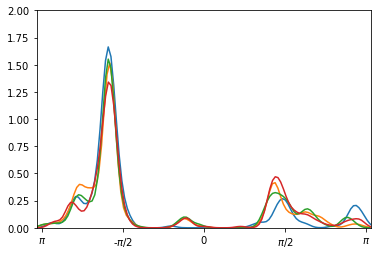

In [564]:
sns.kdeplot(cys,bw=0.1)
sns.kdeplot(phen, bw=0.1)
sns.kdeplot(tyro,bw=0.1)
sns.kdeplot(tryp, bw=0.1)
#sns.kdeplot(leu, bw=0.1)
#sns.kdeplot(ser, bw=0.1)#
#sns.kdeplot(thre,bw=0.1)#
#sns.kdeplot(ala, bw=0.1)#
#sns.kdeplot(glu,bw=0.1)
#sns.kdeplot(asp,bw=0.1)
#sns.kdeplot(ly,bw=0.1)
#sns.kdeplot(val,bw=0.1)
#sns.kdeplot(hist, bw=0.1)
plt.xlim(-np.pi-0.1,np.pi+0.1)
plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],labels=[r"$\pi$","-$\pi/2$","0","$\pi/2$","$\pi$"])
plt.ylim(0,2)
plt.show()

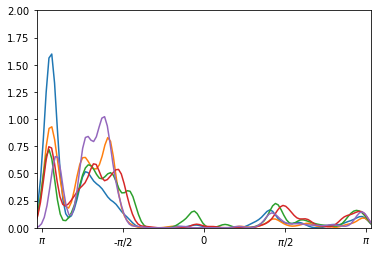

In [546]:
sns.kdeplot(leu, bw=0.1)
sns.kdeplot(thre,bw=0.1)#
sns.kdeplot(ala, bw=0.1)#
sns.kdeplot(asp,bw=0.1)
sns.kdeplot(val,bw=0.1)
plt.xlim(-np.pi-0.1,np.pi+0.1)
plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],labels=[r"$\pi$","-$\pi/2$","0","$\pi/2$","$\pi$"])
plt.ylim(0,2)
plt.show()

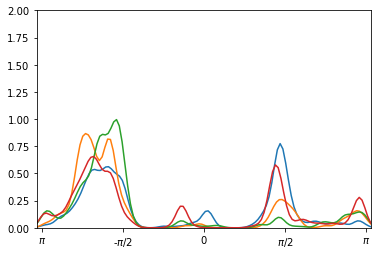

In [568]:
sns.kdeplot(hist,bw=0.1)
sns.kdeplot(ser, bw=0.1)
sns.kdeplot(glu,bw=0.1)
sns.kdeplot(ly,bw=0.1)
plt.xlim(-np.pi-0.1,np.pi+0.1)
plt.xticks([-np.pi,-np.pi/2,0,np.pi/2,np.pi],labels=[r"$\pi$","-$\pi/2$","0","$\pi/2$","$\pi$"])
plt.ylim(0,2)
plt.show()

In [626]:
def PeptideOrder(mol, ring):
    path = list(ring)
    cys_match = mol.GetSubstructMatches(cysteine)
    tyr_match = mol.GetSubstructMatches(tyrosin)
    tryp_match = mol.GetSubstructMatches(tryptophan)
    phe_match = mol.GetSubstructMatches(phenylalanine)
    check = [any(cys_match),any(tyr_match),any(tryp_match),any(phe_match)]
    matches = [cys_match, tyr_match, tryp_match, phe_match]
    loc = []
    if any(check):
        idx = [i for i,j in enumerate(check) if j]
        if len(idx)>1:
            for i in idx:
                for item in matches[i]:
                    loc.append(path.index(item[-3]))
            minloc = np.min(loc)
            order = [path[x] for x in range(minloc,12)]+[path[x] for x in range(minloc)]
        elif len(idx)==1:
            tmp = matches[idx[0]]
            for item in tmp:
                loc.append(path.index(item[-3]))
            minloc = np.min(loc)
            order = [path[x] for x in range(minloc,12)]+[path[x] for x in range(minloc)]
        else:
            order = ring
    return order

In [554]:
cyclic_peptide = Chem.SDMolSupplier("Peptide/CREST/combine.sdf")

In [619]:
amplitude = []
phase = []
smarts = Chem.MolFromSmarts("C1(=O)CNCCNCCNCCN1")

In [620]:
mol = cyclic_peptide[1]
matches = mol.GetSubstructMatches(smarts)[0]
coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in match]
trans_coords = RING.Translate(np.array(coords)) 
amp, ang = RING.GetRingPuckerCoords(trans_coords)

In [713]:
amplitude1 = []
phase1 = []
amplitude2 = []
phase2 = []
for mol in cyclic_peptide:
    matches = mol.GetSubstructMatches(smarts)[0]
    correct = [matches[x] for x in [0,2,3,4,5,6,7,8,9,10,11,12]]
    gly_match = mol.GetSubstructMatches(glycine)
    # 
    cys_match = mol.GetSubstructMatches(cysteine)
    tyr_match = mol.GetSubstructMatches(tyrosin)
    tryp_match = mol.GetSubstructMatches(tryptophan)
    phe_match = mol.GetSubstructMatches(phenylalanine)
    ####
    hist_match = mol.GetSubstructMatches(histidine)
    glu_match = mol.GetSubstructMatches(glutamic_acid)
    ly_match = mol.GetSubstructMatches(lysine)
    ser_match = mol.GetSubstructMatches(serine)
    ####
    leu_match = mol.GetSubstructMatches(leucine)
    thre_match = mol.GetSubstructMatches(threonine)
    ala_match = mol.GetSubstructMatches(alanine)
    asp_match =  mol.GetSubstructMatches(aspartic_acid)
    val_match =  mol.GetSubstructMatches(valine)
    # len(leu_match)==0 and len(thre_match)==0 and len(ala_match)==0 and len(asp_match)==0 and len(val_match)==0 and len(glu_match)==0 and len(ser_match)==0 and len(ly_match)==0 and len(hist_match)==0:

    if any(cys_match) and len(tyr_match)==0 and len(tryp_match)==0 and len(phe_match)==0 and len(hist_match)==0 and len(leu_match)==0 and len(gly_match)==0:
        #carbon = cys_match[0][-3]
        #idx = correct.index(carbon)
        #match = [correct[x] for x in range(idx,12)]+[correct[x] for x in range(idx)]
        order =PeptideOrder(mol, correct)
        coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in order]
        trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
        amp, ang = RING.GetRingPuckerCoords(trans_coords)
        amplitude1.append(amp)
        phase1.append(ang)
    elif any(phe_match) and len(cys_match)==0:
        carbon = phe_match[0][-3]
        idx = correct.index(carbon)
        match = [correct[x] for x in range(idx,12)]+[correct[x] for x in range(idx)]
        coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in match]
        trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
        amp, ang = RING.GetRingPuckerCoords(trans_coords)
        amplitude2.append(amp)
        phase2.append(ang)
    else:
        continue
    

In [714]:
ampframe1 = pd.DataFrame(amplitude1)
phaseframe1 = pd.DataFrame(phase1)
ampframe2 = pd.DataFrame(amplitude2)
phaseframe2 = pd.DataFrame(phase2)

In [710]:
len(ampframe1)

621

In [686]:
x = np.linspace(-np.pi,np.pi,100)
y1 = x+np.random.uniform(-1.1,1.1,100) 
y2 = -x+np.random.uniform(-1.1,1.1,100) 

In [687]:
join = pd.DataFrame({"x":list(x)+list(x),"y":list(y1)+list(y2)})

(array([20., 21., 14., 10.,  3.,  3.,  5.,  5.,  4.,  9.,  6.,  5.,  5.,
         5.,  5.,  4., 11., 24., 16., 25.]),
 array([0.02599053, 0.33798083, 0.64997112, 0.96196142, 1.27395171,
        1.58594201, 1.8979323 , 2.2099226 , 2.52191289, 2.83390319,
        3.14589348, 3.45788378, 3.76987407, 4.08186437, 4.39385466,
        4.70584496, 5.01783525, 5.32982555, 5.64181585, 5.95380614,
        6.26579644]),
 <a list of 20 Patch objects>)

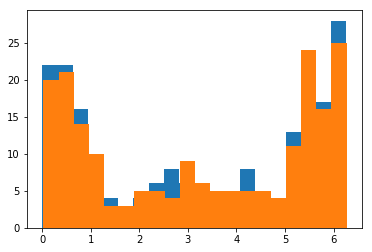

In [689]:
plt.hist(np.mod(join["x"]-join["y"],np.pi*2),bins=20)
plt.hist(np.mod(join["x"]+join["y"],2*np.pi),bins=20)

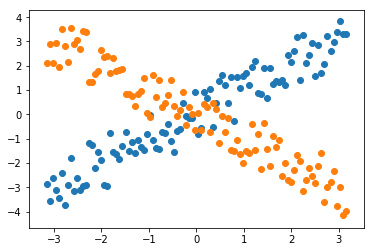

In [690]:
plt.scatter(x,y1)
plt.scatter(x,y2)

(array([270.,  58.,  64.,  29.,  25.,  17.,  15.,  15.,  48.,  80.]),
 array([6.73319655e-04, 6.28453119e-01, 1.25623292e+00, 1.88401272e+00,
        2.51179252e+00, 3.13957232e+00, 3.76735212e+00, 4.39513192e+00,
        5.02291171e+00, 5.65069151e+00, 6.27847131e+00]),
 <a list of 10 Patch objects>)

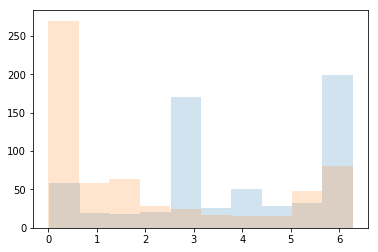

In [711]:
plt.hist(np.mod(phaseframe1[1]-phaseframe1[3],np.pi*2),bins=10,alpha=.2)
plt.hist(np.mod(phaseframe1[1]+phaseframe1[3],np.pi*2),bins=10,alpha=.2)

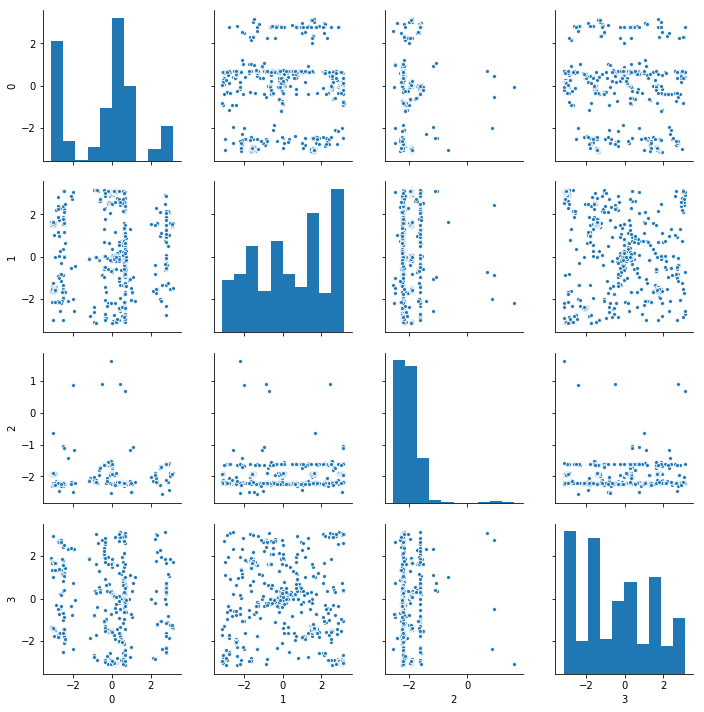

In [712]:
sns.pairplot(phaseframe1,plot_kws=dict(s=15))
#sns.pairplot(phaseframe2,plot_kws=dict(s=15))

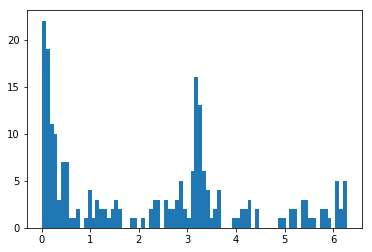

In [715]:
plt.hist(np.mod(phaseframe[1]-phaseframe[3],np.pi*2),bins=80)
plt.show()

In [179]:
aa = (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)<1.6) & (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)>1)
bb = (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)>4.2) & (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)<4.7)
qq = [aa|bb]
cc = phaseframe[aa | bb]

In [196]:
tmp = [cyclic_peptide[i] for i in cc.index]

In [197]:
wrt = Chem.SDWriter("check_1.sdf")
for mol in tmp:
    wrt.write(mol)
wrt.close()

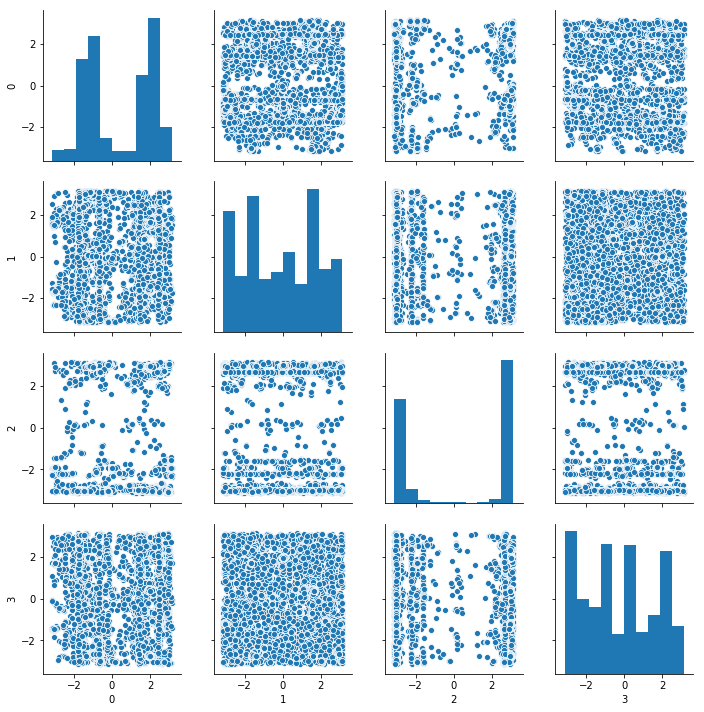

In [145]:
sns.pairplot(phaseframe)

In [87]:
amplitude = []
phase = []
for mol in cyclic_peptide:
    mol_edges = []
    for bond in mol.GetBonds():
        mol_edges.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
    data = py_rdl.Calculator.get_calculated_result(mol_edges)
    for urf in data.urfs:
        rcs = data.get_relevant_cycles_for_urf(urf)
        for rc in rcs:
            ringatoms = RING.Rearrangement(mol,list(rc.nodes), order="default")
            rcsize = len(ringatoms)
        if rcsize==12:    
            coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in ringatoms]
            trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
            amp, ang = RING.GetRingPuckerCoords(trans_coords)
    amplitude.append(amp)
    phase.append(ang)

In [111]:
data = pd.DataFrame(phase)
data1 = pd.DataFrame(amplitude)
ss = data.apply(np.sin)
cc = data.apply(np.cos)

In [112]:
join = pd.DataFrame([data1[0]*cc[0],data1[0]*ss[0],data1[1]*cc[1],data1[1]*ss[1],data1[2]*cc[2],data1[2]*ss[2],
                     data1[3]*cc[3],data1[3]*ss[3],data1[4]]).T

In [114]:
from sklearn.decomposition import PCA
pca = PCA(n_components=9)
a =pd.DataFrame(pca.fit_transform(join))

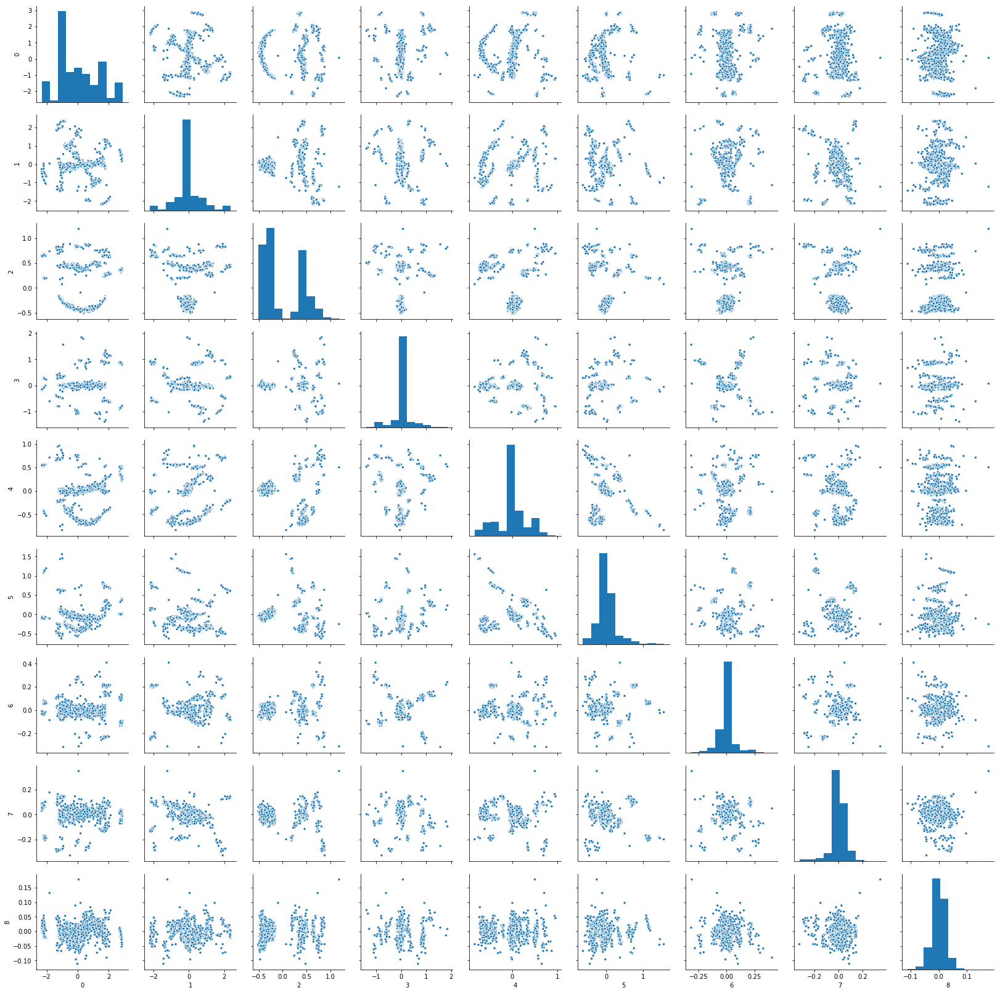

In [56]:
from itertools import product
amino_acid_list = ["H","K","D","E","G","C","S","T","A","V","F","W","L","Y"]
peptideset = list(product(amino_acid_list,repeat=2))
sep = ''
peptidelist = [sep.join(item) for item in peptideset]
peptide = [Chem.MolFromSequence(item) for item in peptidelist]


In [93]:
HD = Chem.MolFromSequence("HD")
HE = Chem.MolFromSequence("HE")
KD = Chem.MolFromSequence("KD")
KE = Chem.MolFromSequence("KE")
FH = Chem.MolFromSequence("FH")
Chem.MolToSmiles(FH)

'N[C@@H](Cc1ccccc1)C(=O)N[C@@H](Cc1c[nH]cn1)C(=O)O'

In [98]:
HD1 = Chem.MolFromSmiles("NC(Cc1c[nH]cn1)C(=O)NC(CC(=O)O)C(=O)")
HE1 = Chem.MolFromSmiles("NC(Cc1c[nH]cn1)C(=O)NC(CCC(=O)O)C(=O)")
KD1 = Chem.MolFromSmiles("NCCCCC(N)C(=O)NC(CC(=O)O)C(=O)")
KE1 = Chem.MolFromSmiles("NCCCCC(N)C(=O)NC(CCC(=O)O)C(=O)")
FH1 = Chem.MolFromSmiles("NC(Cc1ccccc1)C(=O)NC(Cc1c[nH]cn1)C(=O)")

In [ ]:
keep = []
for index, mol in enumerate(cyclic_peptide):
    if any(mol.GetSubstructMatches(histidine)) or any(mol.GetSubstructMatches(phenylalanine)) or any(mol.GetSubstructMatches(tryptophan)) or any(mol.GetSubstructMatches(tyrosin)):
        continue
    else:
        keep.append(index)

In [105]:
keep = []
for index, mol in enumerate(cyclic_peptide):
    if any(mol.GetSubstructMatches(serine)):
        keep.append(index)

In [112]:
keepmol = []
for i in val:
    keepmol.append(molecule[i])

In [114]:
sdfwriter = Chem.SDWriter("checkss.sdf")
for mol in keepmol:
    sdfwriter.write(mol)
sdfwriter.close()

In [ ]:
intra_rxn = AllChem.ReactionFromSmarts('([C:1][C:2](=[O:6])[O:3].[NH2:4][C:5])>>[C:1][C:2](=[O:6])[N:4][C:5]')

In [130]:
val = data[(data["p4"]>-0.75) | (data["p4"]<-2)].index

In [134]:
tmp = data.iloc[val,:]

In [146]:
p2 = data["p2"]
p3 = data["p3"]
p4 = data["p4"]
p5 = data["p5"]

(array([ 45.,  18.,  25.,  78.,  31.,  28.,  32.,  16.,  25.,  21., 100.,
        111., 167., 124., 143., 230., 168., 320., 709., 278., 103., 102.,
        157., 173., 602., 311., 212., 146., 192., 138., 664., 351., 308.,
        163., 219., 136., 660., 364., 297.,  64.,  45.,  52.,  47.,  46.,
         41.,  58.,  63.,  54., 106., 456.]),
 array([-6.26397094, -6.01311271, -5.76225448, -5.51139626, -5.26053803,
        -5.0096798 , -4.75882157, -4.50796335, -4.25710512, -4.00624689,
        -3.75538866, -3.50453044, -3.25367221, -3.00281398, -2.75195575,
        -2.50109753, -2.2502393 , -1.99938107, -1.74852284, -1.49766462,
        -1.24680639, -0.99594816, -0.74508993, -0.49423171, -0.24337348,
         0.00748475,  0.25834298,  0.5092012 ,  0.76005943,  1.01091766,
         1.26177589,  1.51263411,  1.76349234,  2.01435057,  2.2652088 ,
         2.51606702,  2.76692525,  3.01778348,  3.26864171,  3.51949993,
         3.77035816,  4.02121639,  4.27207462,  4.52293284,  4.77379107,
 

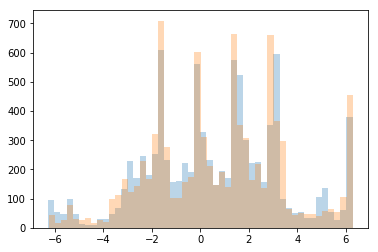

In [162]:
#plt.hist(np.mod(p3+p5,np.pi*2),bins=50,alpha=.2)
#plt.hist(np.mod(p3-p5,np.pi*2),bins=50,alpha=.2)
#plt.hist(np.mod(p3-p4,np.pi*2),bins=50,alpha=.3)
#plt.hist(np.mod(p3+p4,np.pi*2),bins=50,alpha=.3)
plt.hist(p2+p3,bins=50,alpha=.3)
plt.hist(p2-p3,bins=50,alpha=.3)

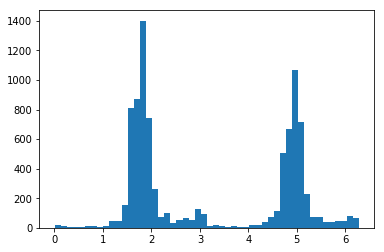

In [184]:
plt.hist(np.mod(p2+p4,np.pi*2),bins=50)
plt.show()

In [185]:
tmp = data[(np.mod(p2+p4,np.pi*2)<2) ]

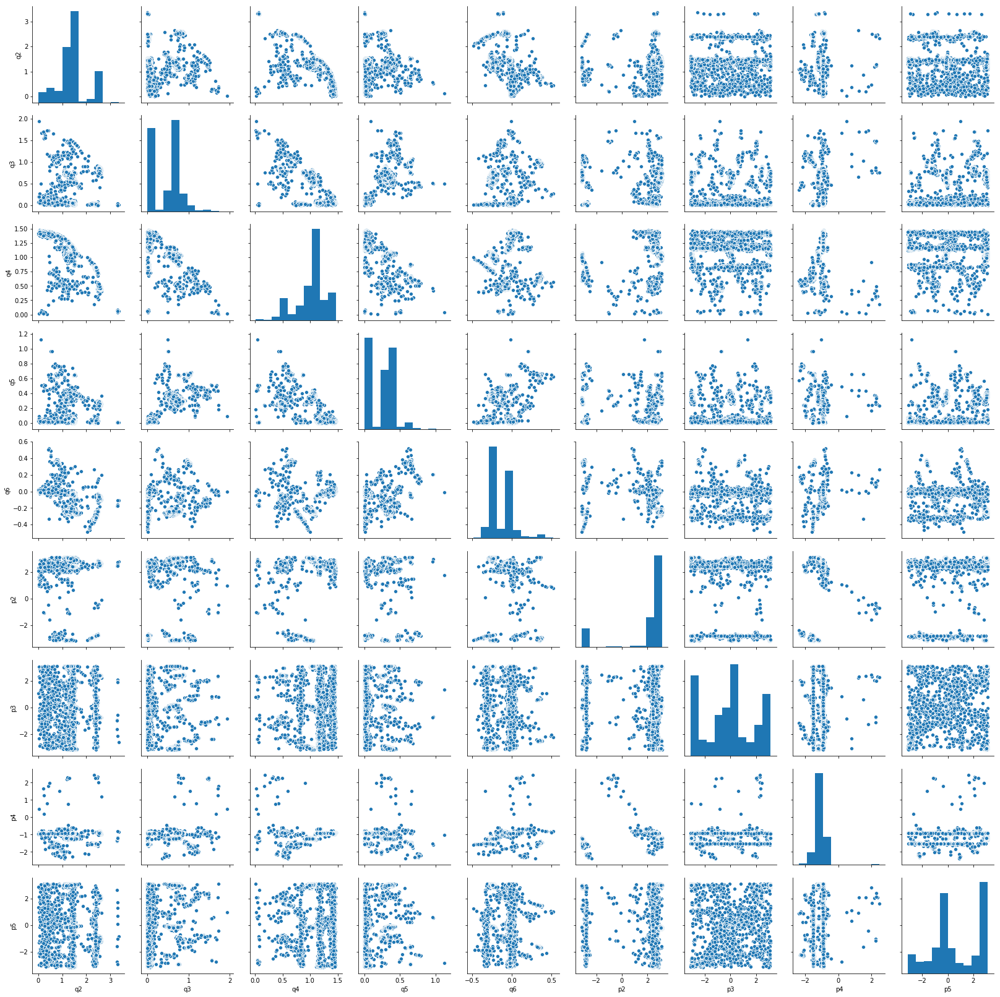

In [186]:
sns.pairplot(tmp)

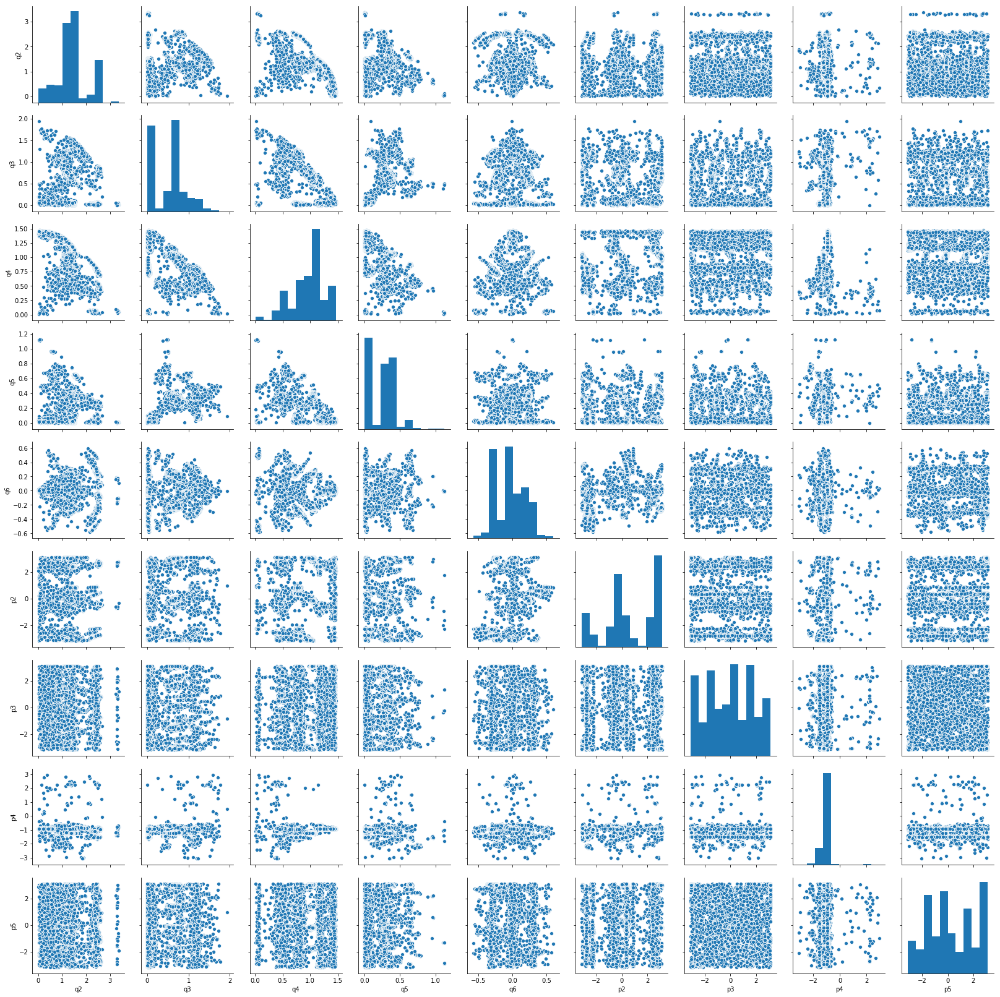

In [133]:
sns.pairplot(data)

In [19]:
old = pd.read_csv("peptide_CP.txt")
data = pd.read_csv("pep/peptide_CP.txt")

In [138]:
amplitude= []
angle = []
amide = Chem.MolFromSmarts("[C](=O)@;-[NH]")
sidechain = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([*])[CX3](=[OX1])[OX2H,OX1-,N]")
sub = []
side = []
molidx = []
for index, mol in enumerate(molecule):
    matches = list(mol.GetSubstructMatches(amide))
    sidematches = list(mol.GetSubstructMatches(sidechain))
    sidebond = [[x[1],x[2]] for x in sidematches]
    amidebond = [sorted([x[0],x[2]]) for x in matches]
    mol_edges = []
    for bond in mol.GetBonds():
        mol_edges.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
    data = py_rdl.Calculator.get_calculated_result(mol_edges)
    for urf in data.urfs:
        rcs = data.get_relevant_cycles_for_urf(urf)
        for rc in rcs:
            rcsize = len(list(rc.nodes))
            ringlist = RING2.Rearrangement(mol,list(rc.nodes), order="BCE")
            if rcsize==12:
                rbond = [sorted([ringlist[i], ringlist[i+1]]) for i in range(11)] + [sorted([ringlist[-1], ringlist[0]])]
                for b in rbond:
                    if b in amidebond:
                        location = amidebond.index(b)
                        ringsubpair = matches[location][:2]
                        sub.append(RING2.GetRingSubstituentPosition(mol, ringlist, ringsubpair))
                tmp = []
                for b in sidebond:
                    tmp.append(RING2.GetRingSubstituentPosition(mol, ringlist, b))
                side.append(tmp)
                molidx.append(index)
                coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in ringlist]
                ringc = RING2.Translate(np.array(coords)) # center the ring at origin
                amp, ang = RING2.GetRingPuckerCoords(ringc)
                amplitude.append(amp)
                angle.append(ang)
                

In [162]:
alpha = []
for item in side:
    if len(item)==4:
        alpha.append(item)

In [173]:
alphafull = pd.DataFrame(np.array([item[0] for x in alpha for item in x]).reshape(6544,4))
betafull = pd.DataFrame(np.array([item[1] for x in alpha for item in x]).reshape(6544,4))
joint = pd.concat([alphafull,betafull],axis=1)

In [176]:
joint.columns=[list(range(8))]

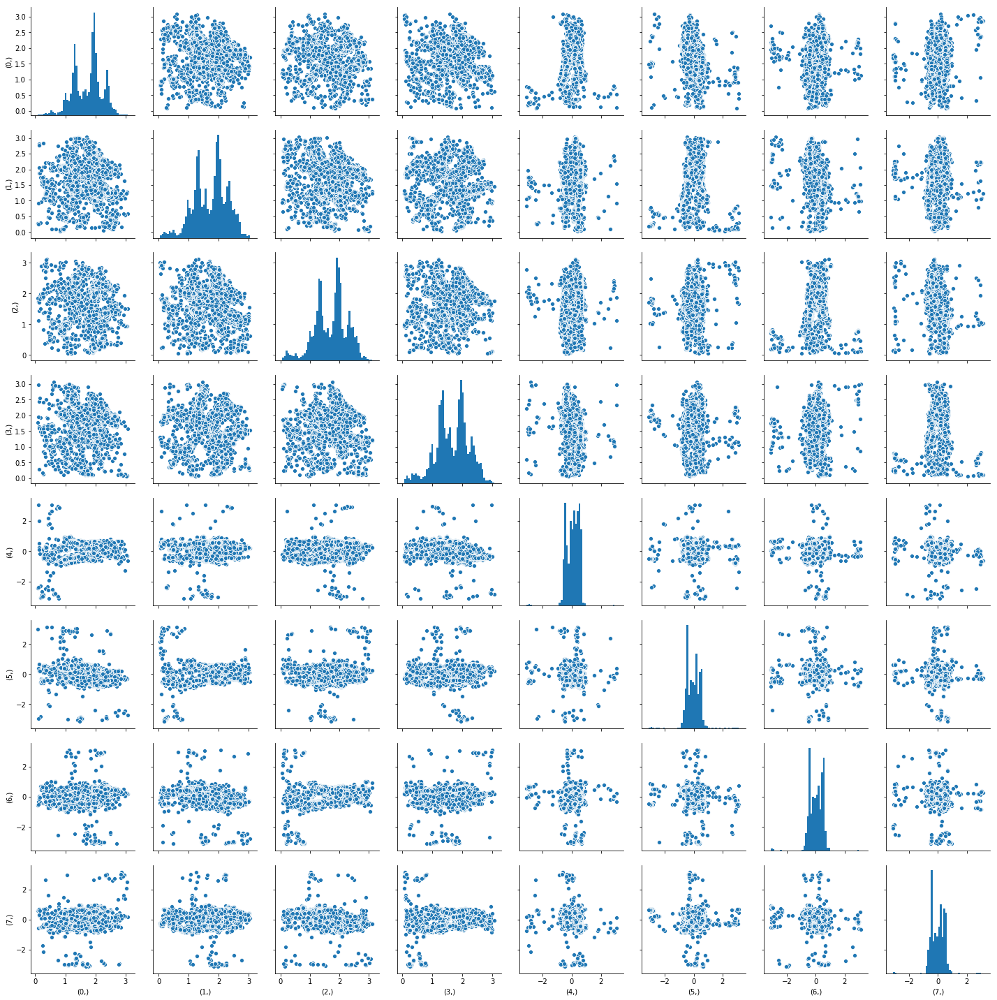

In [177]:
sns.pairplot(joint,diag_kws=dict(bins=50))

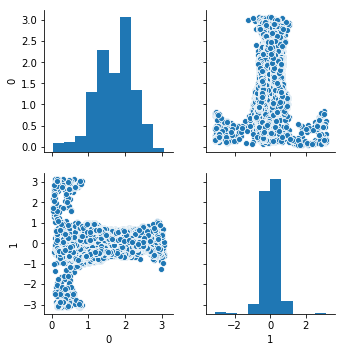

In [133]:
sns.pairplot(pd.DataFrame(side))

In [77]:
subframe = pd.DataFrame(sub, columns=["a","b"])

(array([  40.,   39.,  246.,  256.,  219.,  708., 1625., 3192., 2902.,
        2562., 2358., 1776., 1049.,  924.,  824.,  859., 1268., 1517.,
        1432.,  904.,  969.,  870.,  461.,  242.,  355.,  224.,   45.,
          25.,   25.,   71.,   46.,   43.,   49.,   37.,   46.,   58.,
         115.,  100.,  132.,  291.,  544., 1537.,  530.,  426.,  870.,
        2257.,  716.,  132.,   61.,   19.]),
 array([0.02742055, 0.08958037, 0.15174019, 0.21390002, 0.27605984,
        0.33821966, 0.40037948, 0.4625393 , 0.52469913, 0.58685895,
        0.64901877, 0.71117859, 0.77333842, 0.83549824, 0.89765806,
        0.95981788, 1.02197771, 1.08413753, 1.14629735, 1.20845717,
        1.270617  , 1.33277682, 1.39493664, 1.45709646, 1.51925629,
        1.58141611, 1.64357593, 1.70573575, 1.76789557, 1.8300554 ,
        1.89221522, 1.95437504, 2.01653486, 2.07869469, 2.14085451,
        2.20301433, 2.26517415, 2.32733398, 2.3894938 , 2.45165362,
        2.51381344, 2.57597327, 2.63813309, 2.70029291, 

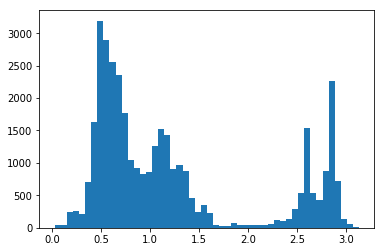

In [79]:
plt.hist(subframe["a"],bins=50)

In [38]:
mol = molecule[0]
mol.GetSubstructMatches(amide)

((1, 0, 2), (10, 11, 12), (14, 15, 16), (18, 19, 20))

In [100]:
alphaframe = pd.DataFrame(subframe["a"].values.reshape([8999,4]))
betaframe = pd.DataFrame(subframe["b"].values.reshape([8999,4]))

In [126]:
angleframe = pd.DataFrame(angle)
ampframe = pd.DataFrame(amplitude)

In [127]:
ee = pd.concat([ampframe,angleframe,alphaframe],axis=1)
ee.columns=["a","b","c","d","e","f","g","h","i","j","k","l","m"]

In [128]:
#qq = ee[(ee["a"]<-1.5) | (ee["a"]>1.5)]

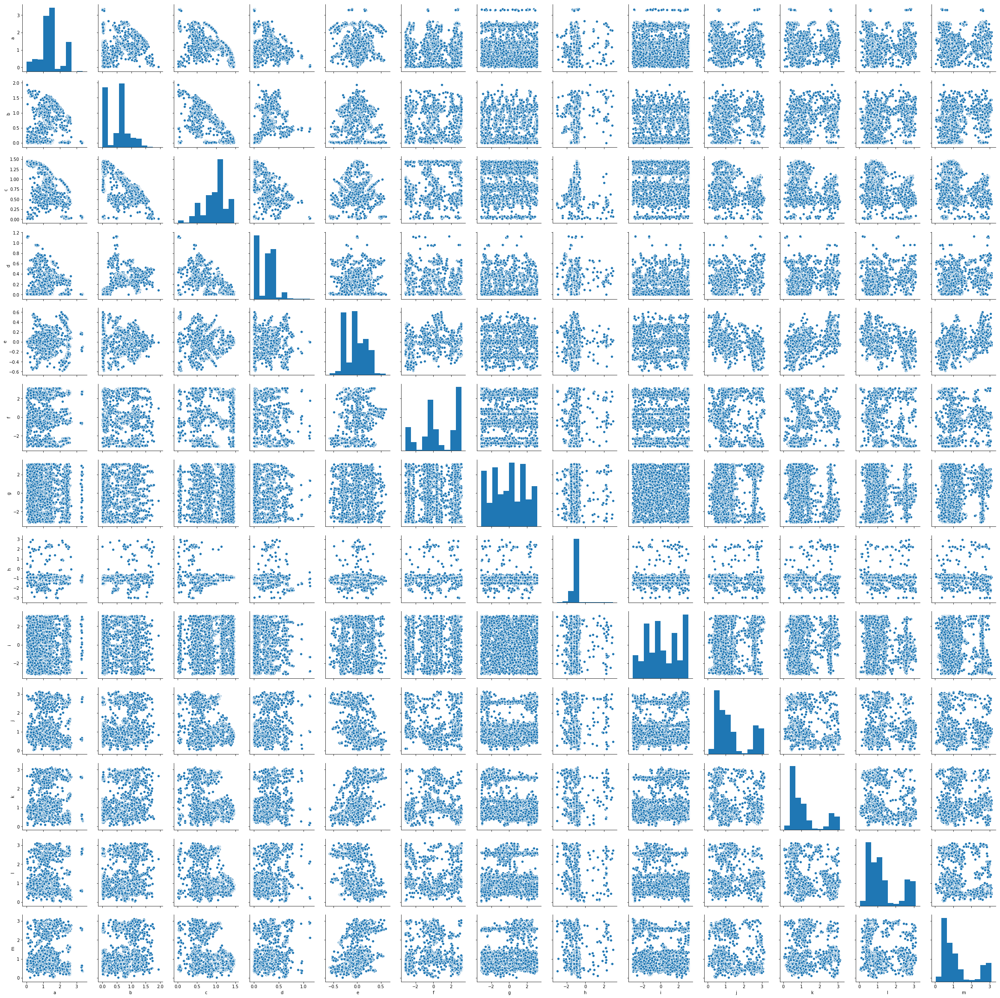

In [129]:
sns.pairplot(ee)

In [41]:
r12 = Chem.MolFromSmarts("[r12]")

In [64]:
a = (1,2,3)

In [65]:
a[:2]

(1, 2)

In [63]:
RING2.GetRingSubstituentPosition(mol,[1,2,3,10,12,14,16,17,18,20,21],(1,0))

(2.380816072320981, 0.6506773500330045)

In [57]:
a = np.array([[-1.978, 0.5369, 0.6633], [-3.0099, 0.2289, 1.231]])

In [58]:
a-np.array([1,1,1])

array([[-2.978 , -0.4631, -0.3367],
       [-4.0099, -0.7711,  0.231 ]])

In [60]:
a = [[2,2,2],[3,3,3]]

In [62]:
np.diff(a,axis=0)

array([[1, 1, 1]])